<a href="https://colab.research.google.com/github/shakasom/rs-python-tutorials/blob/master/RS_Python[.]ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> Tutorial - Access Satellite Imagery via Notebooks </center>


In this notebook we will access raster images from Sentinel-2, visualize and start analysing them. We will cover the following:
* Querry, retrieve and download satellite images directly with Python in Jupyter notebook
* Read and Write Raster images with `rasterio`
* Create RGB and NDVI images from Sentinel-2 Bands
* Access Sentinel-2 images stored in cloud.

## Downloading data with `sentinelsat`

You can access Sentinel 2 images via an online downloading API or via the cloud, but also thanks to Python's `sentinelsat` library.

In [ ]:
# Installations when you run the notebook in colab
!apt install gdal-bin python-gdal python3-gdal 
!pip install rasterio
!apt install python3-rtree 
!pip install git+git://github.com/geopandas/geopandas.git
!pip install descartes
!pip install sentinelsat

In [4]:
# Imports
import folium
import os
import numpy as np
from sentinelsat import SentinelAPI, read_geojson, geojson_to_wkt 
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon, Polygon, mapping
import rasterio as rio
from rasterio.plot import show, reshape_as_image
from shapely.ops import cascaded_union
from rasterio.features import rasterize
import rasterio.mask
import fiona
from skimage import img_as_ubyte
from skimage import exposure
import pprint

To use sentinelsat you first need to register a username in [Copernicus Open Access Hub](https://scihub.copernicus.eu/dhus/#/home) and paste down your username and password in the code below.

In [10]:
user = '##'
password = '##' 

api = SentinelAPI(user, password, 'https://scihub.copernicus.eu/dhus')

We will download the overhead imagery corresponding to forests in the French Franche-Comté region (source: OSM), which are stored in a shapefile. We read it with `geopandas`:

In [3]:
forests = gpd.read_file('../Data/franche-comte-latest-free.shp/gis_osm_landuse_a_free_1.shp')
print(forests.fclass.unique())
print(forests.crs)
forests.head(3)

['scrub' 'meadow' 'forest' 'industrial' 'residential' 'allotments'
 'retail' 'park' 'cemetery' 'military' 'grass' 'commercial' 'heath'
 'recreation_ground' 'farm' 'orchard' 'quarry' 'vineyard' 'nature_reserve']
epsg:4326


,osm_id,code,fclass,name,geometry
0,24336698,7217,scrub,None,"POLYGON ((6.53248 47.43631, 6.53249 47.43643, ..."
1,24337118,7208,meadow,None,"POLYGON ((6.55362 47.42657, 6.55397 47.42664, ..."
2,24337176,7201,forest,None,"POLYGON ((6.51171 47.40685, 6.51178 47.40787, ..."


In [4]:
forests = forests[forests.fclass == 'forest']
print(len(forests))
forests.head(3)

48398


,osm_id,code,fclass,name,geometry
2,24337176,7201,forest,None,"POLYGON ((6.51171 47.40685, 6.51178 47.40787, ..."
3,24629209,7201,forest,None,"POLYGON ((7.05077 47.33620, 7.05312 47.34201, ..."
4,24633532,7201,forest,None,"POLYGON ((7.01523 47.31764, 7.01539 47.31774, ..."


In [4]:
# we can change the crs with the following geopandas method:
# forests = forests.to_crs({'init': 'epsg:32631'})

We can plot the forest polygons on a map using `folium`:

In [5]:
m = folium.Map([47.4, 6.5], zoom_start=8)

folium.GeoJson(forests.head(1000)).add_to(m)
m

Or just plot them with `geopandas`:

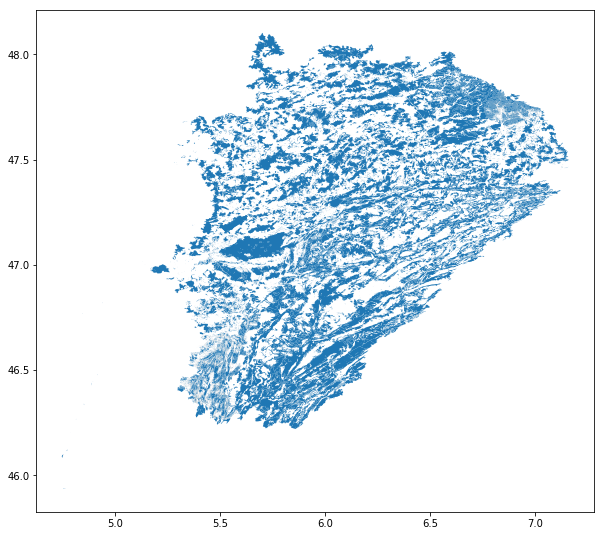

In [19]:
# plot all forest shapes at once
forests.plot(figsize=(10,10))
plt.show()

We will run our Sentinel2 query based on a shapely object geometry (Polygon), so let's extract the first polygon:

In [5]:
# convert 1 row of geodataframe to shapely Polygon
footprint = None
for i in forests['geometry'][0:1]:
    footprint = i
type(footprint)

shapely.geometry.polygon.Polygon

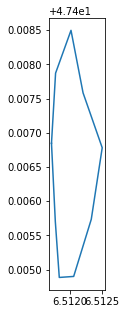

In [6]:
# plot shapely object
plt.figure(figsize=(1,5))
plt.plot(*footprint.exterior.xy)
plt.show()

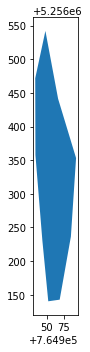

In [11]:
# plot geodataframe row
fig, ax = plt.subplots(figsize=(5,5))
forests[0:1].plot(ax=ax)
plt.tight_layout()
#plt.savefig('figure.png')
plt.show()

Now we can run a query on the API we have created above. There are different ways to construct a query depending on the use case, here we will create ask for Sentinel-2 images Level 2A with cloud coverage between 0 and 10% that fall or intersect with the footprint (area of study). For the time period, we are interested in Sentinel Level 2A satellite images taken between '20200404' and '20200408', which should already yield several images due to the high image update frequency over France (for reference on valid search queries please refer to [scihub](https://scihub.copernicus.eu/userguide/OpenSearchAPI)).

In [11]:
products = api.query(footprint,
                     date = ('20200404', '20200408'),
                     platformname = 'Sentinel-2',
                     processinglevel = 'Level-2A',
                     cloudcoverpercentage = (0,10))

We get a dictionary of all products available in this period with the query specification. In this case, we receive 4 images, but you could tweak the query for your use case - for example expanding the time period or increasing the cloud coverage percentage.  


In [12]:
len(products)

4

From here we can create a GeodataFrame from the product dictionary and sort them according to cloud coverage percentage.

In [13]:
products_gdf = api.to_geodataframe(products)
products_gdf_sorted = products_gdf.sort_values(['cloudcoverpercentage'], ascending=[True])
products_gdf_sorted

/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,title,link,link_alternative,link_icon,summary,beginposition,endposition,ingestiondate,orbitnumber,relativeorbitnumber,...,processingbaseline,processinglevel,producttype,platformname,size,filename,level1cpdiidentifier,identifier,uuid,geometry
d45ddf02-a027-4673-a4a2-5d27e64c7961,S2A_MSIL2A_20200407T104021_N0214_R008_T31TGN_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2020-04-07T10:40:21.024Z, Instrument: MS...",2020-04-07 10:40:21.024,2020-04-07 10:40:21.024,2020-04-07 16:51:10.953,25030,8,...,02.14,Level-2A,S2MSI2A,Sentinel-2,1.00 GB,S2A_MSIL2A_20200407T104021_N0214_R008_T31TGN_2...,S2A_OPER_MSI_L1C_TL_MPS__20200407T110356_A0250...,S2A_MSIL2A_20200407T104021_N0214_R008_T31TGN_2...,d45ddf02-a027-4673-a4a2-5d27e64c7961,"MULTIPOLYGON (((6.70935 46.80389, 6.76532 46.9..."
c8fb2860-efe3-407a-abef-53a2aa5e536e,S2A_MSIL2A_20200407T104021_N0214_R008_T32TLT_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2020-04-07T10:40:21.024Z, Instrument: MS...",2020-04-07 10:40:21.024,2020-04-07 10:40:21.024,2020-04-07 16:55:49.328,25030,8,...,02.14,Level-2A,S2MSI2A,Sentinel-2,507.03 MB,S2A_MSIL2A_20200407T104021_N0214_R008_T32TLT_2...,S2A_OPER_MSI_L1C_TL_MPS__20200407T110356_A0250...,S2A_MSIL2A_20200407T104021_N0214_R008_T32TLT_2...,c8fb2860-efe3-407a-abef-53a2aa5e536e,"MULTIPOLYGON (((6.37728 46.83564, 6.72510 46.8..."
85fa1176-363d-4d04-be07-d3a95e18a47d,S2A_MSIL2A_20200404T103021_N0214_R108_T31TGN_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2020-04-04T10:30:21.024Z, Instrument: MS...",2020-04-04 10:30:21.024,2020-04-04 10:30:21.024,2020-04-04 20:57:52.913,24987,108,...,02.14,Level-2A,S2MSI2A,Sentinel-2,1.10 GB,S2A_MSIL2A_20200404T103021_N0214_R108_T31TGN_2...,S2A_OPER_MSI_L1C_TL_MPS__20200404T124447_A0249...,S2A_MSIL2A_20200404T103021_N0214_R108_T31TGN_2...,85fa1176-363d-4d04-be07-d3a95e18a47d,"MULTIPOLYGON (((7.05903 46.79367, 7.13526 47.7..."
79044d19-d130-421d-a647-6d582a79df7e,S2A_MSIL2A_20200404T103021_N0214_R108_T32TLT_2...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,https://scihub.copernicus.eu/dhus/odata/v1/Pro...,"Date: 2020-04-04T10:30:21.024Z, Instrument: MS...",2020-04-04 10:30:21.024,2020-04-04 10:30:21.024,2020-04-04 20:38:57.417,24987,108,...,02.14,Level-2A,S2MSI2A,Sentinel-2,1.11 GB,S2A_MSIL2A_20200404T103021_N0214_R108_T32TLT_2...,S2A_OPER_MSI_L1C_TL_MPS__20200404T124447_A0249...,S2A_MSIL2A_20200404T103021_N0214_R108_T32TLT_2...,79044d19-d130-421d-a647-6d582a79df7e,"MULTIPOLYGON (((6.37728 46.83564, 7.81665 46.8..."


We could also create a geojson file with `api.to_geojson(products)`, or get each product's metadata with `api.get_product_odata('product_id')`.

Let's check with `folium` if the products match with our forest polygons (in the map, we can choose the layer we display with the layer control toggle on the right):

In [15]:
m = folium.Map([47.4, 6.5], zoom_start=8)

folium.GeoJson(forests[0:500], name='forests').add_to(m)
folium.GeoJson(products_gdf_sorted['geometry'], name='satellite images',
               style_function=lambda x: {'color':'#228B22'}).add_to(m)
folium.LatLngPopup().add_to(m)
folium.LayerControl().add_to(m)
m

Let's say we are interested in the first satellite image since it has the least cloud coverage. We simply call `api.download(<image id>)` (and to download all images we could use `api.download_all()`). Beware, this could take a while, as Sentinel 2 satellite image tiles are about 1 GB each.

In [14]:
api.download("c8fb2860-efe3-407a-abef-53a2aa5e536e")

Downloading: 100%|██████████| 532M/532M [01:23<00:00, 6.38MB/s] 
MD5 checksumming: 100%|██████████| 532M/532M [00:03<00:00, 157MB/s]  


{'id': 'c8fb2860-efe3-407a-abef-53a2aa5e536e',
 'title': 'S2A_MSIL2A_20200407T104021_N0214_R008_T32TLT_20200407T113125',
 'size': 531712414,
 'md5': 'F68B48BF40E279BBF339DF0BDFC43A9A',
 'date': datetime.datetime(2020, 4, 7, 10, 40, 21, 24000),
 'footprint': 'POLYGON((7.168489309055363 47.83679684435136,7.155148000321558 47.80718644444384,7.090105018842064 47.66223487327056,7.02519533892263 47.51726037424013,6.959664699551944 47.372436494868914,6.894373230169248 47.22744189759093,6.829938601253819 47.08228903361849,6.765324555159915 46.93729397086368,6.7251022156911 46.84142863874846,6.377280362167834 46.835643714163524,6.327926759464818 47.82259512731069,7.168489309055363 47.83679684435136))',
 'url': "https://scihub.copernicus.eu/dhus/odata/v1/Products('c8fb2860-efe3-407a-abef-53a2aa5e536e')/$value",
 'Online': True,
 'Creation Date': datetime.datetime(2020, 4, 7, 16, 56, 2, 363000),
 'Ingestion Date': datetime.datetime(2020, 4, 7, 16, 55, 49, 328000),
 'path': './S2A_MSIL2A_20200407T

Once the download is over, we can simply unzip it. In the next sections, we will process, analyze and visualize the satellite image, mainly with `rasterio`.

## Create RGB Image

Once we unzip the downloaded folder, we get many subfolders. Sentinel-2 data is multispectral, with 13 bands in the visible, near infrared and shortwave infrared spectrum (RGB correspond to bands 4, 3 and 2 respectively). These bands come in a different spatial resolution ranging from 10 m to 60 m per pixel. There are other higher resolution satellites available (1m to 0.5 cm), but Sentinel-2 data is free and has a high revisit time (below 5 days in most areas), which makes it an excellent option.

Let's create an RGB image with `rasterio` based on the available bands in the downloaded folder.

First we open the 3 bands we need:

In [15]:
# Open Bands 4, 3 and 2 of resolution 10m with rasterio
R10 = '../Data/S2A_MSIL2A_20200407T104021_N0214_R008_T32TLT_20200407T113125.SAFE/GRANULE/L2A_T32TLT_A025030_20200407T104541/IMG_DATA/R10m'

b4 = rio.open(R10+'/T32TLT_20200407T104021_B04_10m.jp2', driver="JP2OpenJPEG") # driver is optional when we read
b3 = rio.open(R10+'/T32TLT_20200407T104021_B03_10m.jp2', driver="JP2OpenJPEG")
b2 = rio.open(R10+'/T32TLT_20200407T104021_B02_10m.jp2', driver="JP2OpenJPEG")

We can get several infos about these bands:

In [16]:
b4.count, b4.width, b4.height

(1, 10980, 10980)

In [17]:
b4.res

(10.0, 10.0)

In [19]:
# check metadata
b4.meta

{'driver': 'JP2OpenJPEG',
 'dtype': 'uint16',
 'nodata': None,
 'width': 10980,
 'height': 10980,
 'count': 1,
 'crs': CRS({'init': 'epsg:32632'}),
 'transform': Affine(10.0, 0.0, 300000.0,
        0.0, -10.0, 5300040.0)}

Matadata shows:  
* crs: `epsg:32632` is WSG84's crs id for the band covering the east of France (`epsg:32631` corresponds to the center of France, etc.). This corresponds very closely to global `espg:2346`. 
* dtype: for now pixel format is `uint16`, we will convert it to `uint8` in order to plot the image once it's written to RGB.

We can also plot each band:

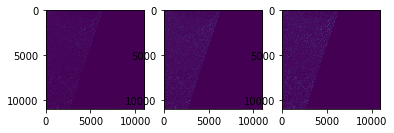

In [24]:
# plot bands with matplotlib
plt.subplot(131) # 1x3 grid, 1st subplot
plt.imshow(b2.read(1))
plt.subplot(132)
plt.imshow(b3.read(1))
plt.subplot(133)
plt.imshow(b4.read(1))
plt.show()

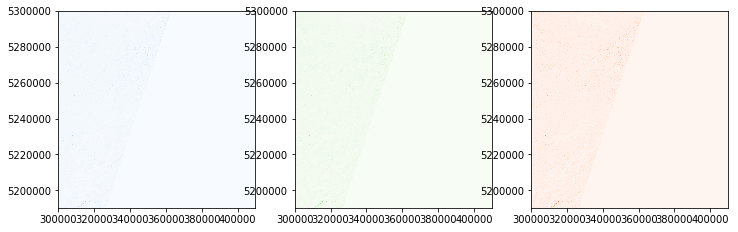

In [59]:
# plot bands with rasterio's plot.show method, in different color shades
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
show(b2, ax=ax1, cmap='Blues')
show(b3, ax=ax2, cmap='Greens')
show(b4, ax=ax3, cmap='Reds')
plt.show()

Pixel intensity is low, but we can still see the 3 bands, with their trapezoidal shape.

#### Fastest method

We create an empty 3-d array to hold the three channels. We are going to scale each band to the range 0-255, which corresponds to 8-bit pixel format, so we specify `dtype=np.uint8`:

In [29]:
channels = np.empty([3, b2.read(1).shape[0], b2.read(1).shape[1]], dtype=np.uint8)
print(channels.shape)

(3, 10980, 10980)


To adjust exposure (pixel intensity), we do a histogram stretch on each band using `skimage.exposure`, we convert them to 8-bit using `img_as_ubyte`, and we save them into the 3-d array:

In [30]:
for index, image in enumerate([b4.read(1), b3.read(1), b2.read(1)]):
    stretched = exposure.equalize_hist(image)    
    channels[index, :, :] = img_as_ubyte(stretched)

We write a new TIF image with `rasterio`, making sure we apply the correct metadata:

In [32]:
num_chans, height, width = channels.shape
transform = b2.transform
crs = b2.crs
profile = b2.profile

with rasterio.open('../Data/test.tif','w', driver = 'GTiff', height = height, width = width, count = num_chans,
                   dtype = channels.dtype, crs = crs, transform = transform, nodata = 0.0) as dst:
    dst.write(channels)
    keys = ['4','3','2']
    for index, chan_name in enumerate(keys):
        dst.update_tags(index + 1, name = chan_name)            

We can now read and use the new TIF. We can also convert it to other formats if needed (PNG, JPEG).

In [35]:
with rasterio.open('../Data/test.tif') as infile:
    
    profile = infile.profile
    profile['driver'] = 'PNG' # we change the driver from GTIFF to PNG
    print(f"\nnew profile: {pprint.pformat(infile.profile)}\n")
    png_filename = tif_filename.with_suffix('.png') # new suffix with pathlib
    raster = infile.read()
    with rasterio.open('../Data/test.png', 'w', **profile) as dst:
        dst.write(raster)
    
    profile['driver'] = 'JPEG'
    jpeg_filename = tif_filename.with_suffix('.jpeg')
    with rasterio.open('../Data/test.jpeg', 'w', **profile) as dst:
        dst.write(raster)


new profile: {'count': 3,
 'crs': CRS({'init': 'epsg:32632'}),
 'driver': 'GTiff',
 'dtype': 'uint8',
 'height': 10980,
 'interleave': 'pixel',
 'nodata': 0.0,
 'tiled': False,
 'transform': Affine(10.0, 0.0, 300000.0,
       0.0, -10.0, 5300040.0),
 'width': 10980}



`IPython` allows to plot the final JPEG image:

In [36]:
from IPython.display import Image
Image(str('../Data/test.jpeg'))

#### Other manipulations related to conversion to RGB

In this sub-section you'll find other file manipulations I went through before coming up with the final method presented above to write a RGB image from raster bands. I leave my experiments below for reference.

We can convert the bands to a different bit formats (here, `uint8`) using rasterio's `astype` method. The problem, compared with the `skimage` method presented above, is that it doesn't rescale pixel intensity when changing pixel range (range is larger for 16-bit than for 8-bit, but if for some reason 16-bit values are capped, when changing to 8-bit they could become very low and distorted).

In [27]:
b4_uint8 = b4.read(1).astype(rasterio.uint8) # we read and convert the first (and unique) band in the file
b3_uint8 = b3.read(1).astype(rasterio.uint8) # we read and convert the first (and unique) band in the file
b2_uint8 = b2.read(1).astype(rasterio.uint8) # we read and convert the first (and unique) band in the file

In [29]:
print(b4_uint8.dtype)
b4_uint8

uint8


array([[ 73, 245, 194, ...,   0,   0,   0],
       [ 71, 255, 208, ...,   0,   0,   0],
       [ 56, 235, 235, ...,   0,   0,   0],
       ...,
       [ 79, 138, 187, ...,   0,   0,   0],
       [ 19, 163, 183, ...,   0,   0,   0],
       [218, 158, 188, ...,   0,   0,   0]], dtype=uint8)

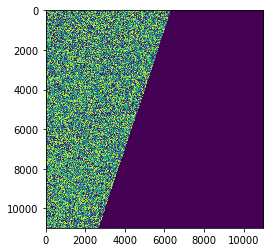

In [9]:
# plot band 4 with plt
plt.imshow(b4_uint8);

The weird look of the image is due to pixel rescaling issues. We can also try with the `float32` pixel format:

In [11]:
b4_float = b4.read(1).astype(rasterio.float32) # we read and convert the first (and unique) band in the file
b4_float.dtype

dtype('float32')

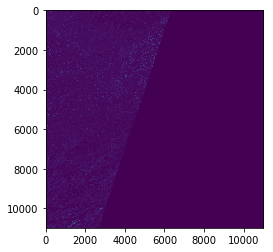

In [12]:
# plot band 4 with plt
plt.imshow(b4_float);

Dark output but the code is correct.

We use rasterio's `write` method to merge the 3 bands into an RGB image:

In [ ]:
# write RGB tiff image
with rio.open('../Data/RGB3.tiff','w',driver='Gtiff', width=b4.width, height=b4.height, 
              count=3,crs=b4.crs,transform=b4.transform, dtype=b4.dtypes[0]) as rgb:
    rgb.write(b4.read(1),1) 
    rgb.write(b3.read(1),2) 
    rgb.write(b2.read(1),3) 
    rgb.close()

Finally, we can show it with rasterio's `show` method, or with matplotlib's `imshow` method. 

Matplotlib doesn't support 16-bit, so we need to make sure we convert our image to 8-bit format. For that, we try below to use `opencv` (which does a proper pixel intesity rescaling, but reads images as BGR instead of RGB, which can mess up the whole thing) and `skimage` (which will be our preferred choice for the final method). We also need to make sure that matplotlib receives an array with the correct shape, i.e. clour channels stored in the last dimension (rasterio has a `reshape_as_img` function and numpy has a `swap_axes` function to reorder dimension).

In [ ]:
src = rio.open('../Data/RGB3.tiff','r', count=3)
print(src.meta)
show(src);

In [16]:
raster_img = src.read()
print(raster_img.shape)
print(raster_img.dtype)
raster_img

(3, 10980, 10980)
uint16


array([[[841, 757, 706, ...,   0,   0,   0],
        [839, 767, 720, ...,   0,   0,   0],
        [824, 747, 747, ...,   0,   0,   0],
        ...,
        [335, 138, 187, ...,   0,   0,   0],
        [275, 163, 183, ...,   0,   0,   0],
        [218, 158, 188, ...,   0,   0,   0]],

       [[623, 576, 539, ...,   0,   0,   0],
        [601, 557, 539, ...,   0,   0,   0],
        [569, 561, 539, ...,   0,   0,   0],
        ...,
        [304, 224, 224, ...,   0,   0,   0],
        [285, 245, 229, ...,   0,   0,   0],
        [233, 223, 238, ...,   0,   0,   0]],

       [[450, 413, 400, ...,   0,   0,   0],
        [427, 413, 391, ...,   0,   0,   0],
        [437, 419, 374, ...,   0,   0,   0],
        ...,
        [184, 102, 130, ...,   0,   0,   0],
        [171, 102, 133, ...,   0,   0,   0],
        [169,  71, 117, ...,   0,   0,   0]]], dtype=uint16)

In [4]:
# Convert bit format with opencv
uint8 = cv2.convertScaleAbs(src.read(), alpha=(255.0/2970.0))
print(uint8.shape)
print(uint8.dtype)
uint8

(1, 10980, 10980)
uint8


array([[[255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        ...,
        [255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0]]], dtype=uint8)

In [ ]:
cv2.imshow('image', uint8)

In [7]:
# Invert color channels with opencv
img_bgr = cv2.cvtColor(src.read(), cv2.COLOR_RGB2BGR)

In [ ]:
cv2.imshow('image', img_bgr)

In [21]:
# Rescale intensity and convert to uint8 with skimage
img = img_as_ubyte(exposure.rescale_intensity(src.read()))
print(img.shape)
img

array([[[11, 10,  9, ...,  0,  0,  0],
        [11, 10,  9, ...,  0,  0,  0],
        [11, 10, 10, ...,  0,  0,  0],
        ...,
        [ 4,  1,  2, ...,  0,  0,  0],
        [ 3,  2,  2, ...,  0,  0,  0],
        [ 3,  2,  2, ...,  0,  0,  0]],

       [[ 8,  7,  7, ...,  0,  0,  0],
        [ 8,  7,  7, ...,  0,  0,  0],
        [ 7,  7,  7, ...,  0,  0,  0],
        ...,
        [ 4,  3,  3, ...,  0,  0,  0],
        [ 3,  3,  3, ...,  0,  0,  0],
        [ 3,  3,  3, ...,  0,  0,  0]],

       [[ 6,  5,  5, ...,  0,  0,  0],
        [ 5,  5,  5, ...,  0,  0,  0],
        [ 6,  5,  5, ...,  0,  0,  0],
        ...,
        [ 2,  1,  1, ...,  0,  0,  0],
        [ 2,  1,  1, ...,  0,  0,  0],
        [ 2,  0,  1, ...,  0,  0,  0]]], dtype=uint8)

In [32]:
# Swap axes with numpy
raster_img_ub = np.swapaxes(raster_img_ub, 0, 2)
print(raster_img_ub.shape)
raster_img_ub

(3, 10980, 10980)


array([[[3, 3, 3, ..., 1, 1, 0],
        [2, 2, 2, ..., 0, 0, 0],
        [2, 2, 2, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[2, 2, 2, ..., 1, 1, 0],
        [2, 2, 2, ..., 0, 0, 0],
        [2, 2, 2, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint8)

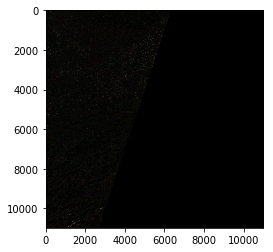

In [23]:
# Reshape image array with rasterio
img = reshape_as_image(img)
plt.imshow(img)

Output is dark, due to pixel rescaling issues along the way.

## Mask Satellite images

We can use rasterio's `mask` class to create a binary mask based on our polygons.

In [62]:
# open original image and compute masking
with rio.open("../Data/RGB3.tiff") as src:
    out_image, out_transform = rio.mask.mask(src, forests['geometry'][797:798])
    out_meta = src.meta.copy()
    out_meta.update({"driver": "GTiff",
                 "height": out_image.shape[1],
                 "width": out_image.shape[2],
                 "transform": out_transform})

# write masked image
# with rasterio.open("../Data/RGB_masked.tiff", "w", **src.meta) as dest:
#     dest.write(masked_image)

# open and show masked image with rasterio
# msk = rio.open(r"RGB_masked.tif")
# fig, ax = plt.subplots(1, figsize=(18, 18))
# show(msk.read([1,2,3]))
# plt.show()

/opt/anaconda3/lib/python3.7/site-packages/rasterio/mask.py:89: UserWarning: shapes are outside bounds of raster. Are they in different coordinate reference systems?
  warnings.warn('shapes are outside bounds of raster. '


The problem her is that the warning tells us that bounds of polygon do not intersect with raster - while they actually do... based on what we could see previously in folium. Below is the method is used to debug this. First, I wrote the script to create masks for all polygons:

In [76]:
src = rio.open("../Data/RGB3.tiff", 'r')

failed = []
for num, row in forests.iterrows():
    try:
        masked_image, out_transform = rio.mask.mask(src, [mapping(row['geometry'])], crop=True, nodata=0)
    except Exception as e:
        failed.append(num)
print("Rasterio failed to mask {} files".format(len(failed)))

Rasterio failed to mask 48398 files


Maybe it fails because of a coordinate system problem.

In [66]:
forests = forests.to_crs({'init' : src.meta['crs']['init']})

/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [67]:
failed = []
for num, row in forests.iterrows():
    try:
        masked_image, out_transform = rio.mask.mask(src, [mapping(row['geometry'])], crop=True, nodata=0)
    except Exception as e:
        failed.append(num)
print("Rasterio failed to mask {} files".format(len(failed)))

Rasterio failed to mask 48398 files


Still the same problem, no shape intersects. Let's try to convert shapes not only to the image CRS, but also using the raster's `transform` attribute, in order to project the polygons into the image pixel space.

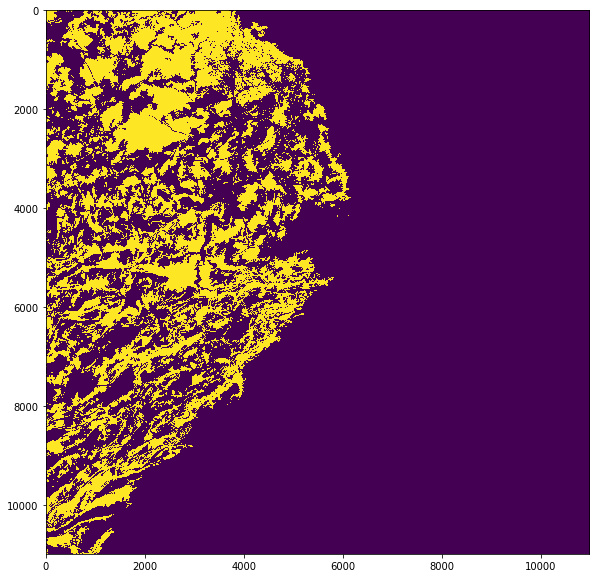

In [68]:
def poly_from_utm(polygon, transform):
    poly_pts = []
    
    # make a polygon from multipolygon
    poly = cascaded_union(polygon)
    for i in np.array(poly.exterior.coords):
        
        # transfrom polygon to image crs, using raster meta
        poly_pts.append(~transform * tuple(i))
        
    # make a shapely Polygon object
    new_poly = Polygon(poly_pts)
    return new_poly

# creating binary mask

poly_shp = []
im_size = (src.meta['height'], src.meta['width'])
for num, row in forests.iterrows():
    if row['geometry'].geom_type == 'Polygon':
        poly = poly_from_utm(row['geometry'], src.meta['transform'])
        poly_shp.append(poly)
    else:
        for p in row['geometry']:
            poly = poly_from_utm(p, src.meta['transform'])
            poly_shp.append(poly)

mask = rasterize(shapes=poly_shp,
                 out_shape=im_size)

# plotting the mask

plt.figure(figsize=(10,10))
plt.imshow(mask);

It worked !! We've got the mask.

In [ ]:
# saving mask
bin_mask_meta = src.meta.copy()
bin_mask_meta.update({'count': 1})
with rasterio.open("train.jp2", 'w', **bin_mask_meta) as dst:
    dst.write(mask * 255, 1)

If needed, we can convert the new polygon geometries in the image pixel coordinate system into a new geoseries and geodataframe:

In [130]:
forests = forests.reset_index(drop=True)
forests_new = gpd.GeoDataFrame(gpd.GeoSeries(poly_shp), columns = ['geometry'], crs={'init':'epsg:32632'})
print(type(forests_new))
print(forests_new.crs)
forests_new.head(1)

<class 'geopandas.geodataframe.GeoDataFrame'>
+init=epsg:32632 +type=crs


,geometry
0,"POLYGON ((1227.221 4666.108, 1228.071 4654.725..."


## Create NDVI 

The Normalized Difference Vegetation Index (NDVI) is an important indicator to assess the presence/absence of green vegetation from satellite images. It is often used to monitor forests health (**it could help for the detection of tree diseases**! See more info [here](https://en.wikipedia.org/wiki/Normalized_difference_vegetation_index)). 

To calculate the NDVI, you need the Red and Near-Infrared (NIR) bands. Different satellite images assign different numbers for these bands. Sentinel Images have red in 4th band and NIR in the 8th band. The formula for NDVI calculation is:

$$ NDVI = \frac{NIR - R}{NIR + R}$$

To carry this out in rasterio we need first to read the 4th and 8th bands as arrays. We also need to make sure that the arrays are floats.

In [64]:
b4 = rio.open(R10+'/T32TLT_20200407T104021_B04_10m.jp2')
b8 = rio.open(R10+'/T32TLT_20200407T104021_B08_10m.jp2')

In [65]:
red = b4.read()
nir = b8.read()

In [66]:
ndvi = (nir.astype(float) - red.astype(float)) / (nir + red)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


We can now write the NDVI image, making sure we assign it an updated metadata:

In [67]:
meta = b4.meta
meta.update(driver='GTiff')
meta.update(dtype=rasterio.float32)

with rasterio.open('NDVI.tif', 'w', **meta) as dst:
    dst.write(ndvi.astype(rasterio.float32))

And finally we can read and plot the image:

In [68]:
dst = rio.open('../Data/NDVI.tif')
dst = dst.read()
print(dst.shape)
dst

(1, 10980, 10980)


array([[[0.41819438, 0.44440368, 0.4347478 , ...,        nan,
                nan,        nan],
        [0.4191762 , 0.43290204, 0.41794664, ...,        nan,
                nan,        nan],
        [0.40634006, 0.42516354, 0.40359282, ...,        nan,
                nan,        nan],
        ...,
        [0.67865705, 0.80753136, 0.7777778 , ...,        nan,
                nan,        nan],
        [0.6946141 , 0.79586726, 0.807267  , ...,        nan,
                nan,        nan],
        [0.71240103, 0.81168056, 0.80355275, ...,        nan,
                nan,        nan]]], dtype=float32)

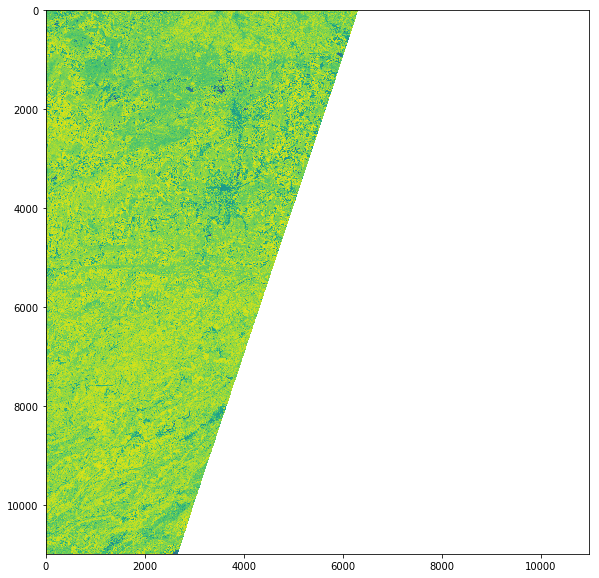

In [13]:
plt.figure(figsize=(10,10))
show(dst);

## Accessing data stored in AWS cloud

As we saw, downloading rasters and working with satellite bands locally can be very costly in terms of memory. TO solve this problem, rasterio allows us to access images stored in a cloud service such as AWS.

In [14]:
fpath = 'http://landsat-pds.s3.amazonaws.com/c1/L8/003/065/LC08_L1TP_003065_20190925_20191017_01_T1/LC08_L1TP_003065_20190925_20191017_01_T1_B4.TIF'
#this is band 4

def rasterio_open(f):
    return rio.open(f)

src_image = rasterio_open(fpath)
print(src_image.profile)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 7601, 'height': 7741, 'count': 1, 'crs': CRS({'init': 'epsg:32619'}), 'transform': Affine(30.0, 0.0, 363285.0,
       0.0, -30.0, -683685.0), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}


In [21]:
overview = src_image.overviews(1)[-1]
overview

81

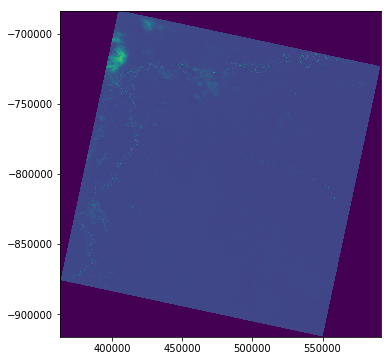

In [23]:
fig, ax = plt.subplots(1, figsize=(6, 6))
show(src_image, ax=ax)
plt.show()

We convert the pixels to float32 with rasterio:

In [24]:
src_image_array = src_image.read(1)
src_image_array = src_image_array.astype("f4")
src_image_array

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [25]:
src_image_array[src_image_array==0] = np.nan

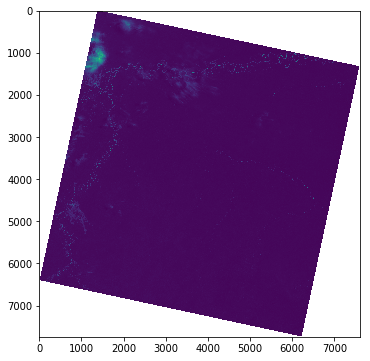

In [27]:
fig, ax = plt.subplots(1, figsize=(6, 6))
show(src_image_array, ax=ax)
plt.show()

In [30]:
print(src_image_array.dtype)
print(src_image_array.shape)

float32
(7741, 7601)


### Get subset of an image

Since rasters are still computationally intensive to work with in a notebook, we can clip the image and use only our areas of interest, thanks to rasterio's `window` class. Syntax is `window.Window(col_offset, row_offset, width, height)`:

In [32]:
window = rio.windows.Window(1200, 1200, 750, 850)

In [34]:
subset = src_image.read(1, window=window)
subset.shape

(850, 750)

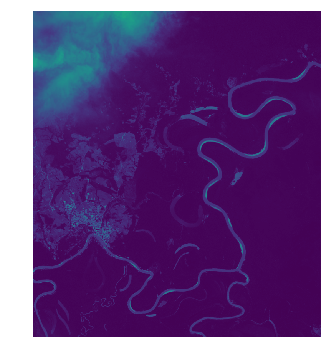

In [35]:
fig, ax = plt.subplots(1, figsize=(6, 6))
show(subset, ax=ax)
ax.set_axis_off()
plt.show()

### Create RGB image

With a similar methos as in previous sections, we use rasterio to write an RGB image from 3 Sentinel-2 bands - the only difference is that the source is online.

In [36]:
rpath = 'http://landsat-pds.s3.amazonaws.com/c1/L8/003/065/LC08_L1TP_003065_20190925_20191017_01_T1/LC08_L1TP_003065_20190925_20191017_01_T1_B4.TIF'
gpath = 'http://landsat-pds.s3.amazonaws.com/c1/L8/003/065/LC08_L1TP_003065_20190925_20191017_01_T1/LC08_L1TP_003065_20190925_20191017_01_T1_B3.TIF'
bpath = 'http://landsat-pds.s3.amazonaws.com/c1/L8/003/065/LC08_L1TP_003065_20190925_20191017_01_T1/LC08_L1TP_003065_20190925_20191017_01_T1_B2.TIF'

In [37]:
red = rio.open(rpath)
green = rio.open(gpath)
blue = rio.open(bpath)

In [38]:
red_array = red.read(1)
green_array = green.read(1)
blue_array = blue.read(1)

In [39]:
print(red.profile)
print(red.width)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 7601, 'height': 7741, 'count': 1, 'crs': CRS({'init': 'epsg:32619'}), 'transform': Affine(30.0, 0.0, 363285.0,
       0.0, -30.0, -683685.0), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}
7601


In [41]:
# Create an RGB image 
with rio.open('../Data/RGB2.tiff','w',driver='Gtiff', width=red.width, height=red.height, 
              count=3,crs=red.crs,transform=red.transform, dtype=red.dtypes[0]) as rgb:
    rgb.write(blue.read(1),1) 
    rgb.write(green.read(1),2) 
    rgb.write(red.read(1),3) 
    rgb.close()

In [42]:
rgb = rio.open("../Data/RGB2.tiff")

In [45]:
rgb.profile

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 7601, 'height': 7741, 'count': 3, 'crs': CRS({'init': 'epsg:32619'}), 'transform': Affine(30.0, 0.0, 363285.0,
       0.0, -30.0, -683685.0), 'tiled': False, 'interleave': 'pixel'}

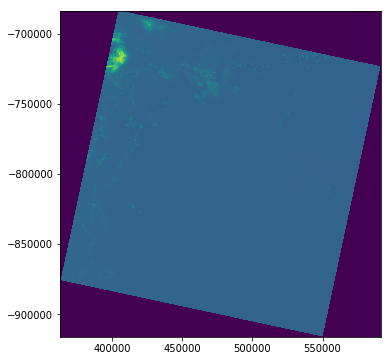

In [44]:
fig, ax = plt.subplots(1, figsize=(6, 6))
show(rgb, ax=ax)
plt.show()